In [ ]:
!pip install wget
!pip install ffmpeg
!pip install scikit-learn-extra

  Preparing metadata (setup.py) ... done
  Created wheel for wget: filename=wget-3.2-py3-none-any.whl size=9657 sha256=bf828285ddd8ba6d053378ed851798f62d91a2965106df60ee3f6fed04424ed6
  Stored in directory: /root/.cache/pip/wheels/8b/f1/7f/5c94f0a7a505ca1c81cd1d9208ae2064675d97582078e6c769
Successfully built wget


In [ ]:
os.mkdir('frames')

In [ ]:
import wget
t = 0
count = 0

In [ ]:
def get_time():
  # Get the current time in seconds since the epoch
  current_time_seconds = time.time()

  # Convert the time to a readable format
  formatted_time = time.strftime("%Y-%m-%d %H:%M:%S", time.localtime(current_time_seconds))

  # Print the current time
  print("Current Time:", formatted_time)

In [ ]:
import cv2
import numpy as np
from sklearn_extra.cluster import KMedoids
import matplotlib.pyplot as plt
import time



def extract_frames(video_path, num_frames):
    cap = cv2.VideoCapture(video_path)
    frames = []
    for _ in range(num_frames):
        ret, frame = cap.read()
        count += 1
        if not ret:
            break
        frames.append(frame)

    cap.release()
    return frames

def preprocess_frames(frames):
    # Resize frames to a common size (you may adjust this based on your needs)
    resized_frames = [cv2.resize(frame, (100, 100)) for frame in frames]

    # Flatten each frame to a 1D array
    flattened_frames = [frame.flatten() for frame in resized_frames]

    return np.array(flattened_frames)

def kmedoids_clustering(frames_data, k):
    # Perform k-Medoids clustering with scikit-learn-extra
    kmedoids = KMedoids(n_clusters=k, random_state=123)
    kmedoids.fit(frames_data)

    # Get cluster labels and medoids
    clusters = kmedoids.labels_
    medoids = kmedoids.medoid_indices_

    return clusters, medoids

def visualize_clustering(frames_data, clusters, medoids, original_frames):
    fig, axes = plt.subplots(1, len(medoids)+1, figsize=(100,20))

    # Plot the first 5 frames
    for i in range(len(medoids)):
        axes[i].imshow(cv2.cvtColor(original_frames[medoids[i]], cv2.COLOR_BGR2RGB))
        axes[i].axis('off')
        axes[i].set_title(f'Frame {i + 1}')

    # Plot the clustering result
    axes[len(medoids)].scatter(frames_data[:, 0], frames_data[:, 1], c=clusters, cmap='viridis', alpha=0.5)
    axes[len(medoids)].scatter(frames_data[medoids, 0], frames_data[medoids, 1], c='red', marker='*', s=200, label='Medoids')
    axes[len(medoids)].set_title('k-Medoids Clustering')
    axes[len(medoids)].legend()
    axes[len(medoids)].axis('off')

    plt.tight_layout()
    plt.show()


In [ ]:
link = 'https://video.twimg.com/amplify_video/1298294238770278400/vid/480x480/8eivKZ-O4OBV-p-h.mp4?tag=13'
video_path = f'vid{t}.mp4'
t = t+1

In [ ]:
wget.download(link,video_path)

'vid0.mp4'

Current Time: 2023-11-28 20:34:20
start time is None
Number of frames is 8650


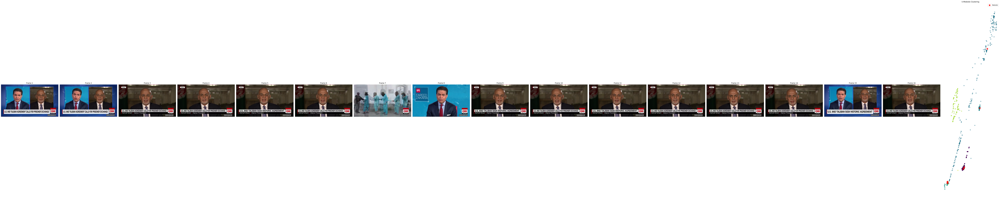

Current Time: 2023-11-28 20:35:47
End time is None


In [ ]:
# Number of frames to process
start_time = get_time()
print(f"start time is {start_time}")
num_clusters = 16  # Number of clusters

frames = extract_frames(video_path, 20000)
num_frames = len(frames)
print(f"Number of frames is {num_frames}")
frames_data = preprocess_frames(frames)

clusters, medoids = kmedoids_clustering(frames_data, num_clusters)

count = num_frames
visualize_clustering(frames_data, clusters, medoids,frames)

end_time = get_time()
print(f"End time is {end_time}")


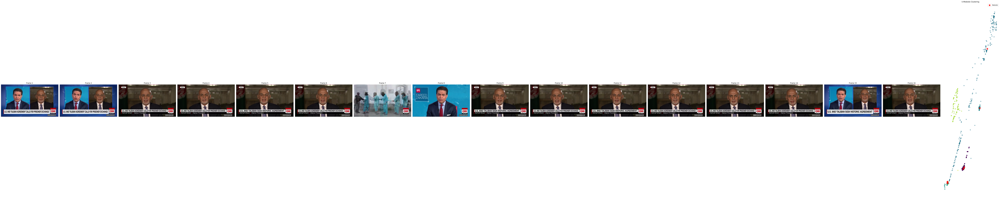

In [ ]:
visualize_clustering(frames_data, clusters, medoids,frames)

In [ ]:
!ffmpeg -i vid0.mp4 frames/frame_%04d.png


ffmpeg version 4.4.2-0ubuntu0.22.04.1 Copyright (c) 2000-2021 the FFmpeg developers
  built with gcc 11 (Ubuntu 11.2.0-19ubuntu1)
  configuration: --prefix=/usr --extra-version=0ubuntu0.22.04.1 --toolchain=hardened --libdir=/usr/lib/x86_64-linux-gnu --incdir=/usr/include/x86_64-linux-gnu --arch=amd64 --enable-gpl --disable-stripping --enable-gnutls --enable-ladspa --enable-libaom --enable-libass --enable-libbluray --enable-libbs2b --enable-libcaca --enable-libcdio --enable-libcodec2 --enable-libdav1d --enable-libflite --enable-libfontconfig --enable-libfreetype --enable-libfribidi --enable-libgme --enable-libgsm --enable-libjack --enable-libmp3lame --enable-libmysofa --enable-libopenjpeg --enable-libopenmpt --enable-libopus --enable-libpulse --enable-librabbitmq --enable-librubberband --enable-libshine --enable-libsnappy --enable-libsoxr --enable-libspeex --enable-libsrt --enable-libssh --enable-libtheora --enable-libtwolame --enable-libvidstab --enable-libvorbis --enable-libvpx --enab

In [ ]:
import cv2
import os

def read_images_from_folder(folder_path):
    images = []

    try:
        # List all files in the directory
        files = os.listdir(folder_path)

        # Iterate through the files
        for file_name in files:
            file_path = os.path.join(folder_path, file_name)

            # Check if the file is an image (you can customize this check based on your file extensions)
            if file_name.lower().endswith(('.png', '.jpg', '.jpeg', '.gif', '.bmp')):
                # Open and append the image to the list
                image = cv2.imread(file_path)
                images.append(image)
                #print(f"Read image: {file_name}")

    except FileNotFoundError:
        print(f"Directory '{folder_path}' not found.")
    except PermissionError:
        print(f"Permission error while accessing '{folder_path}'.")
    except Exception as e:
        print(f"An error occurred: {str(e)}")

    return images

# Replace 'your_folder_path' with the actual path to the folder containing images
folder_path = '/content/frames'

# Read images from the specified folder
image_list = read_images_from_folder(folder_path)


# Now 'image_list' contains all the images in the folder


In [ ]:
import numpy as np

In [ ]:
frames = np.array(image_list)

In [ ]:
frames.shape

(2296, 480, 480, 3)

In [ ]:
list_o_frames = [x for x in frames]

Current Time: 2023-11-29 08:21:09
start time is None
Number of frames is 2296


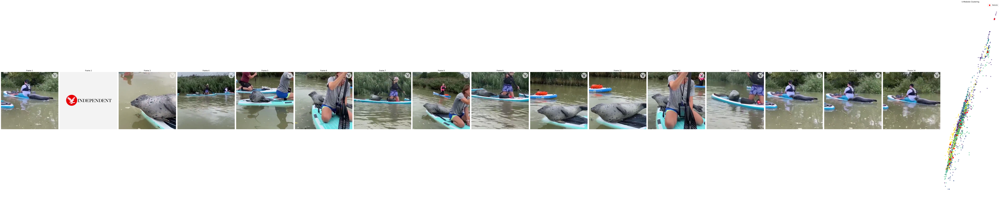

Current Time: 2023-11-29 08:21:24
End time is None


In [ ]:
# Number of frames to process
start_time = get_time()
print(f"start time is {start_time}")
num_clusters = 16  # Number of clusters

# Step 1: Extract frames from the video
num_frames = len(frames)
print(f"Number of frames is {num_frames}")
# Step 2: Preprocess frames
frames_data = preprocess_frames(frames)

# Step 3: Perform k-Medoids clustering
clusters, medoids = kmedoids_clustering(frames_data, num_clusters)

# Step 4: Visualize the clustering result along with the first 5 frames
# count = count/5
count = num_frames
visualize_clustering(frames_data, clusters, medoids,frames)

end_time = get_time()
print(f"End time is {end_time}")
